## Importing all required Libraries

In [ ]:
#Required to be executed for Interactive plots
!pip install hvplot

#Required to be executed for Box plots
!pip install -U matplotlib pandas

#Required to be executed for Radar plots
!pip install matplotlib==3.2.0

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import seaborn as sns
import holoviews as hv
import hvplot.pandas

## Data Frames Creation

In [ ]:
data = pd.read_csv('https://tinyurl.com/ChrisCoDV/001155707/DailyCustomers.csv', index_col=0)
data.index = pd.to_datetime(data.index)
StoreMarketing = pd.read_csv('https://tinyurl.com/ChrisCoDV/001155707/StoreMarketing.csv', index_col=0)
StoreOverHeads = pd.read_csv('https://tinyurl.com/ChrisCoDV/001155707/StoreOverheads.csv', index_col=0)
StoreSize = pd.read_csv('https://tinyurl.com/ChrisCoDV/001155707/StoreSize.csv', index_col=0)
StoreStaff = pd.read_csv('https://tinyurl.com/ChrisCoDV/001155707/StoreStaff.csv', index_col=0)

#Creating Summary Dataframe for all the stores
StoreSummaryData = pd.DataFrame(index=data.columns)
StoreSummaryData['DailyCustomers'] = data.sum().values
StoreSummaryData['StoreSize'] = StoreSize.values
StoreSummaryData['StoreStaff'] = StoreStaff.values
StoreSummaryData['StoreMarketing'] = StoreMarketing.values
StoreSummaryData['StoreOverHeads'] = StoreOverHeads.values

Reading all the datasets & creating 2 data frames as required - one with daily customer visits for all stores and one with all the summary data variables for all stores. 

## Data Segmentation

In [ ]:
#Sorting the Daily Customers data by total number of customers for each store
data_sort = data.reindex(data.sum().sort_values(ascending=False).index, axis=1)

#segmenting the stores as Large, Medium & Small with respect to total number of customers
Large_Stores = data_sort.columns[data_sort.sum()> 300000]
Medium_Stores = data_sort.columns[(data_sort.sum()> 100000) & (data_sort.sum() < 300000)]
Small_Stores = data_sort.columns[data_sort.sum()< 100000]
LargeMed_Stores = data_sort.columns[data_sort.sum()> 100000]

#Sorting the store summary data by daily customers-Descending
StoreSummaryData_Sort = StoreSummaryData.sort_values(by = 'DailyCustomers', ascending=False)

#Filtering Large stores summary data
Large_Stores_SummaryData = StoreSummaryData.loc[Large_Stores , :]

#Filtering Medium stores summary data
Medium_Stores_SummaryData = StoreSummaryData.loc[Medium_Stores, :]                                                                              

#Filtering small stores summary data
Small_Stores_SummaryData = StoreSummaryData.loc[Small_Stores, :]

#Filtering Large & Medium stores summary data
LargeMed_Stores_SummaryData = Large_Stores_SummaryData.append(Medium_Stores_SummaryData)

Classifying the stores as - Stores with Large, medium & small sized and creating the corresponding dataframes. An additional data frame LargeMed_Stores is created for exploring both Large & Medium stores together

## Explorations with Daily Customers Dataframe

### Bar Chart for daily customers - all stores

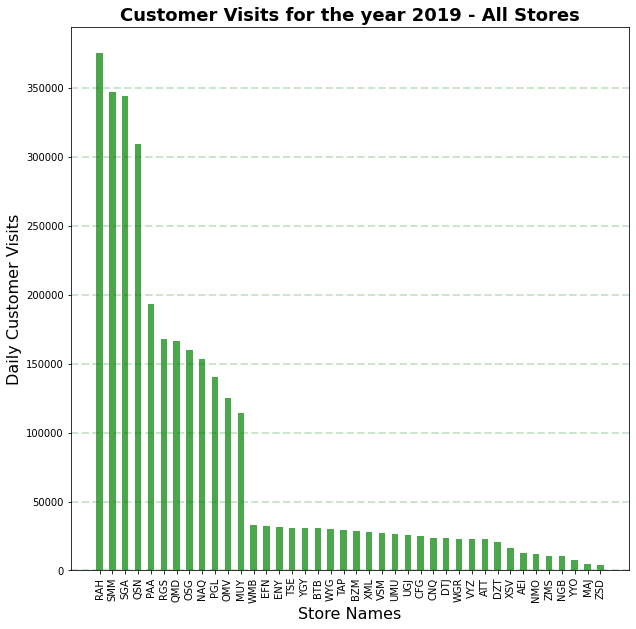

In [ ]:
x = np.arange(len(data_sort.columns))
y = data_sort.sum()

plt.figure(figsize=(10,10))
plt.bar(x,y, color = 'green', width= 0.5, align='center', alpha=0.7)
plt.grid(color='green', linestyle='--', linewidth=2, axis='y', alpha=0.2)
plt.xticks(x,data_sort.columns, rotation=90)
plt.xlabel('Store Names', fontsize=16)
plt.ylabel('Daily Customer Visits', fontsize=16)
plt.title('Customer Visits for the year 2019 - All Stores', fontsize=18, position = (0.5, 1.05), weight = 'bold')
plt.show()

The above bar chart is plotted with Total customer visits in descending order so that the segmentation of Large Medium and Small stores can be made easily

### 28 day rolling avg & trendline for Small stores

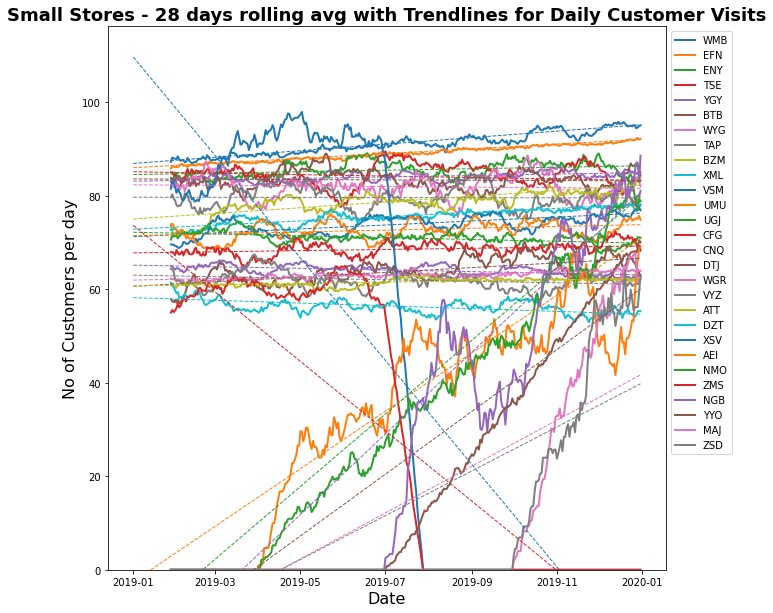

In [ ]:
#Calculate 28 days rolling average
period = 28
Rolling_Avg = data_sort[Small_Stores].rolling(period).mean()

#plotting 28 day rolling avg with trendlines
plt.figure(figsize=(10,10))
plt.plot(Rolling_Avg, linewidth = 2)
plt.gca().set_prop_cycle(None)

#Calculating treandline
for name in Small_Stores:
    x = np.arange(len(data_sort[name]))
    z = np.polyfit(x, data_sort[name], 1)
    trend = np.poly1d(z)
    plt.plot(data_sort.index, trend(x), linestyle='--', linewidth=1)

plt.ylim(ymin=0)
plt.xlabel('Date', fontsize=16)
plt.ylabel('No of Customers per day', fontsize=16)
plt.title('Small Stores - 28 days rolling avg with Trendlines for Daily Customer Visits', fontsize=18, weight = 'bold', position=(0.5,1.05))
plt.legend(Rolling_Avg.columns, bbox_to_anchor=(1,1))
plt.show()

The intention of including the above plot is to identify anamolies with Small stores. As there are higher number of small stores, they are plotted seperately

### Interactive line plot for small stores

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
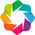

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [ ]:
plot = data_sort[Small_Stores].hvplot.line(
    frame_height=500, frame_width=500,
    xlabel='Date', ylabel='No of Customers',
    title='Total Daily Customers for all stores',
    tools=['pan', 'box_zoom', 'wheel_zoom', 'undo', 'redo', 'hover', 'save', 'reset']
)
hv.extension('bokeh')
plot

The above interactive line plot is plotted for Small stores in an intention to find out any discrepencies other than stores those are closed and new stores that opened in 2019. 

Interactive tools availabe in hvplot are


*   Zoom  - helps to zoom in multiple times and clearly observe the issues.
*   Pan   - to move to a specific area in the plot without zooming.
*   Undo  - to undo any action and return to previous state of the plot.
*   Redo  - to do the same action that was undone.
*   Reset - Brings back the plot to default view.
*   Save  - allows to save a copy of the plot.
*   Hover - displays all information regarding a store when hovered over the line.

It is also possible to fade out all the stores apart from the ones under investigation by just clicking on the legends and disabling them.

### Line Plot with 14 day rolling avg & trendline for Large stores

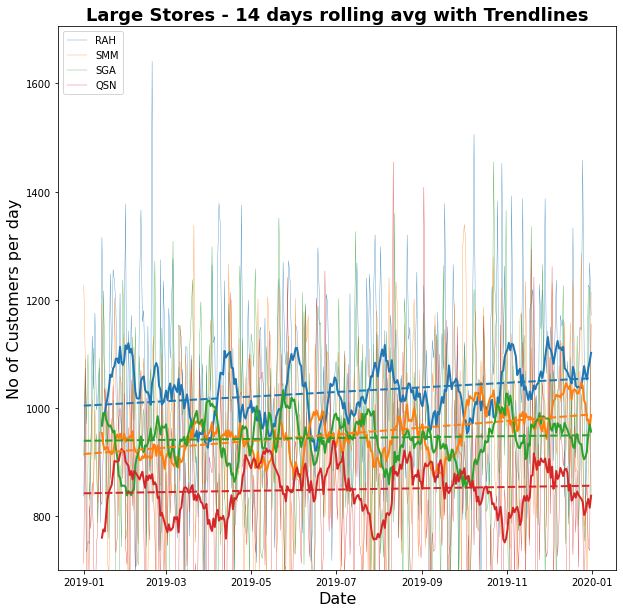

In [ ]:
#Calculate 14 days rolling average
period = 14
Rolling_Avg = data_sort[Large_Stores].rolling(period).mean()

#plotting 14 day rolling avg with trendlines
plt.figure(figsize=(10,10))
plt.plot(data_sort[Large_Stores], linewidth=0.3)
plt.gca().set_prop_cycle(None)
plt.plot(Rolling_Avg, linewidth = 2)
plt.gca().set_prop_cycle(None)

#Calculating treandline
for name in Large_Stores:
    x = np.arange(len(data_sort[name]))
    z = np.polyfit(x, data_sort[name], 1)
    trend = np.poly1d(z)
    plt.plot(data_sort.index, trend(x), linestyle='--', linewidth=2)
plt.ylim(ymin=700)
plt.xlabel('Date', fontsize=16)
plt.ylabel('No of Customers per day', fontsize=16)
plt.title('Large Stores - 14 days rolling avg with Trendlines', fontsize=18, weight = 'bold', position = (0.5,1.05))
plt.legend(Rolling_Avg.columns, loc=2)
plt.show()

The purpose of the above line plot is to identify trends or patterns in Customer visits for Large stores

### Line Plot with 14 day rolling avg & trendline for Medium stores



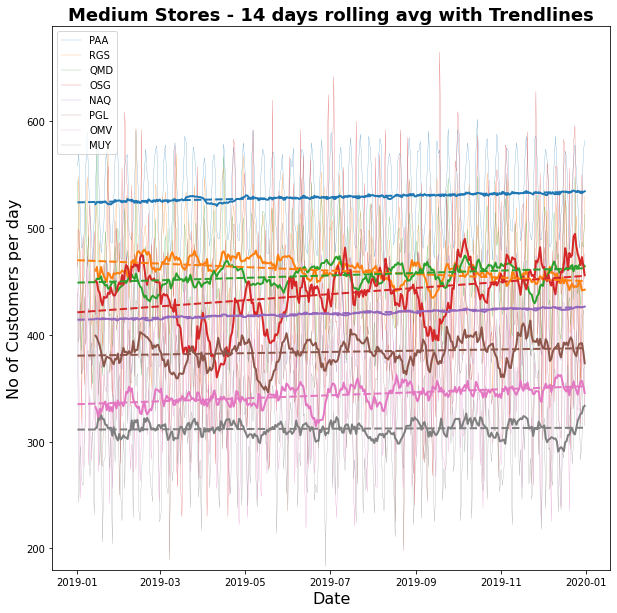

In [ ]:
#Calculate 14 days rolling average
period = 14
Rolling_Avg = data_sort[Medium_Stores].rolling(period).mean()

#plotting 14 day rolling avg with trendlines
plt.figure(figsize=(10,10))
plt.plot(data_sort[Medium_Stores], linewidth=0.2)
plt.gca().set_prop_cycle(None)
plt.plot(Rolling_Avg, linewidth = 2)
plt.gca().set_prop_cycle(None)

#Calculating treandline
for name in Medium_Stores:
    x = np.arange(len(data_sort[name]))
    z = np.polyfit(x, data_sort[name], 1)
    trend = np.poly1d(z)
    plt.plot(data_sort.index, trend(x), linestyle='--', linewidth=2)
plt.ylim(ymin=180)
plt.xlabel('Date', fontsize=16)
plt.ylabel('No of Customers per day', fontsize=16)
plt.title('Medium Stores - 14 days rolling avg with Trendlines', fontsize=18, weight = 'bold', position = (0.5,1.05))
plt.legend(Rolling_Avg.columns, loc=2)
plt.show()

The purpose of the above line plot is to identify trends or patterns in Customer visits for Medium stores

### Interactive Line Sub plot for Medium Stores

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
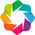

:NdLayout   [Variable]
   :Curve   [Date]   (value)

In [ ]:
plot = data_sort[Medium_Stores].hvplot.line(
    frame_height=200, frame_width=200,
    xlabel='Date', ylabel='No of Customers per day',
    tools=['pan', 'box_zoom', 'wheel_zoom', 'undo', 'redo', 'hover', 'save', 'reset'],
    subplots=True
)
hv.extension('bokeh')
plot

The above interactive line sub plot is plotted for Medium stores in order to assess seasonality. 

Interactive tools availabe in hvplot are
*   Zoom  - helps to zoom in multiple times and clearly observe patterns that may occur weekly or quarterly. In sub plots, when zoom is applied to one sub plot, all the sub plots are zoomed in to same level.
*   Pan   - to move to a specific area in the plot without zooming.
*   Undo  - to undo any action and return to previous state of the plot.
*   Redo  - to do the same action that was undone.
*   Reset - Brings back the plot to default view.
*   Save  - allows to save a copy of the plot.
*   Hover - displays all information regarding a store when hovered over the line.

### Box plots for Large & Medium stores

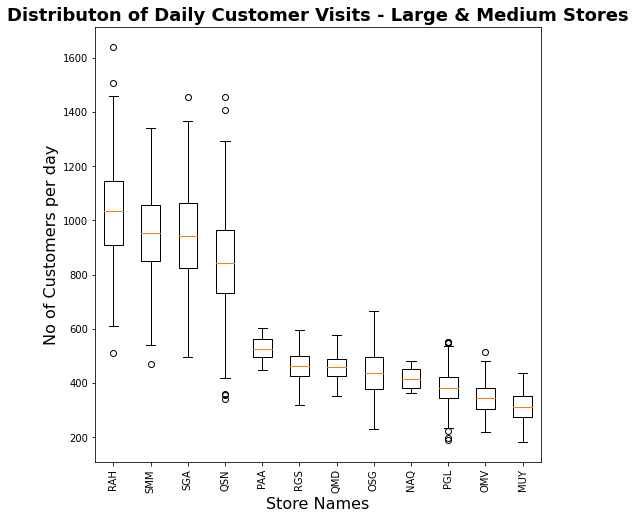

In [ ]:
plt.figure(figsize=(8,8))
plt.boxplot(data_sort[LargeMed_Stores], labels=LargeMed_Stores)
plt.xlabel('Store Names', fontsize=16)
plt.ylabel('No of Customers per day', fontsize=16)
plt.xticks(rotation=90)
plt.title('Distributon of Daily Customer Visits - Large & Medium Stores', fontsize=18, weight= 'bold', position=(0.5,1.5))
plt.show()

The purpose of including the above box plot is to highlight the distribution of Daily customer visits for Large and Medium stores. Information like whether the store have normal distribution, how dense or scarse the distribution is, are there significant amount of outliers can be analysed.

## Summary Data explorations

### HeatMap for summary data - All Stores

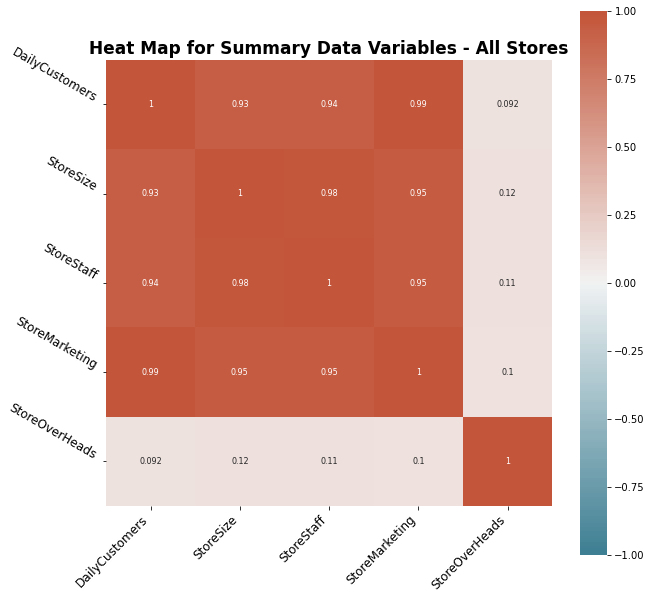

In [ ]:
plt.figure(figsize=(10, 10))
corr = StoreSummaryData.corr()
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(220, 20, n=200), square=True, annot=True,
                 annot_kws={"size": 8})
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize = 12)
ax.set_yticklabels(ax.get_yticklabels(), rotation=330, ha='right', va='bottom', fontsize = 12)
ax.set_title("Heat Map for Summary Data Variables - All Stores", fontsize=17, weight = 'bold')
plt.show()

The above heat map is plotted to find out positive and negative correlation between the summary data variables. This heat map indicates the correlation values considering all the stores (Large, Medium & small).

### HeatMap for summary data - Large & Medium Stores

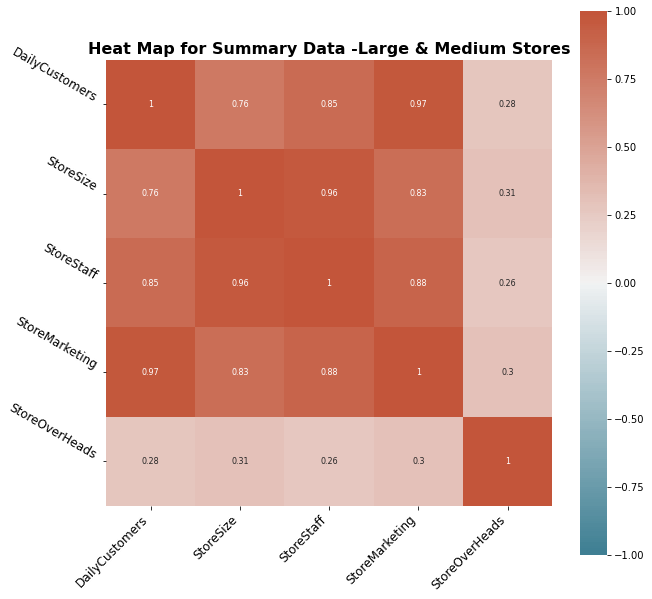

In [ ]:
plt.figure(figsize=(10, 10))
corr = LargeMed_Stores_SummaryData.corr()
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(220, 20, n=200), square=True, annot=True,
                 annot_kws={"size": 8})
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize = 12)
ax.set_yticklabels(ax.get_yticklabels(), rotation=330, ha='right', va='bottom', fontsize = 12)
ax.set_title("Heat Map for Summary Data -Large & Medium Stores", fontsize=16, weight = 'bold')
plt.show()

The above heat map is plotted to find out how the degree of correlation between the summary data variables varies if just Large and Medium stores are considered.

### Radar Sub plots for Large Stores

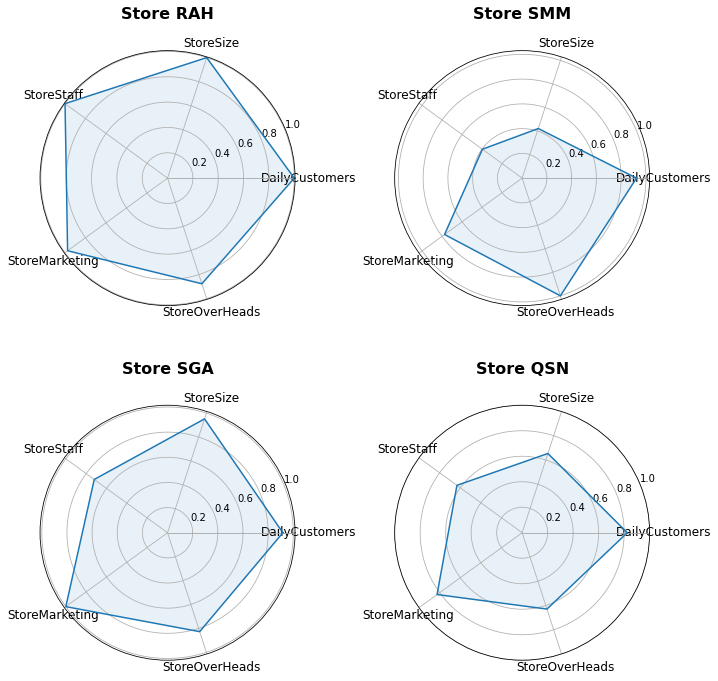

In [ ]:
#Calculating Normalised Data for Radar plots
NormalisedData = Large_Stores_SummaryData / Large_Stores_SummaryData.max()

angles = [n / float(len(Large_Stores_SummaryData.columns)) * 2 * np.pi for n in range(len(Large_Stores_SummaryData.columns) +1)]
plt.figure(figsize=(10,10))
counter = 1
for name in Large_Stores_SummaryData.index:
    values = NormalisedData.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub = plt.subplot(2,2, counter, polar=True)
    sub.plot(angles, values)
    sub.fill(angles, values, alpha=0.1)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles)
    sub.set_xticklabels(Large_Stores_SummaryData.columns, fontsize=12)
    sub.set_title('Store ' + name, fontsize=16, position = (0.5, 1.1), weight='bold')
    counter += 1
plt.subplots_adjust(wspace=0.2, hspace = 0.2)
plt.tight_layout()
plt.show()

The purpose of above Radar subplots is to compare all the summary data variables/dimensions for Large Stores and confirm the findings from heat map.

### Radar Sub plots for Medium Stores

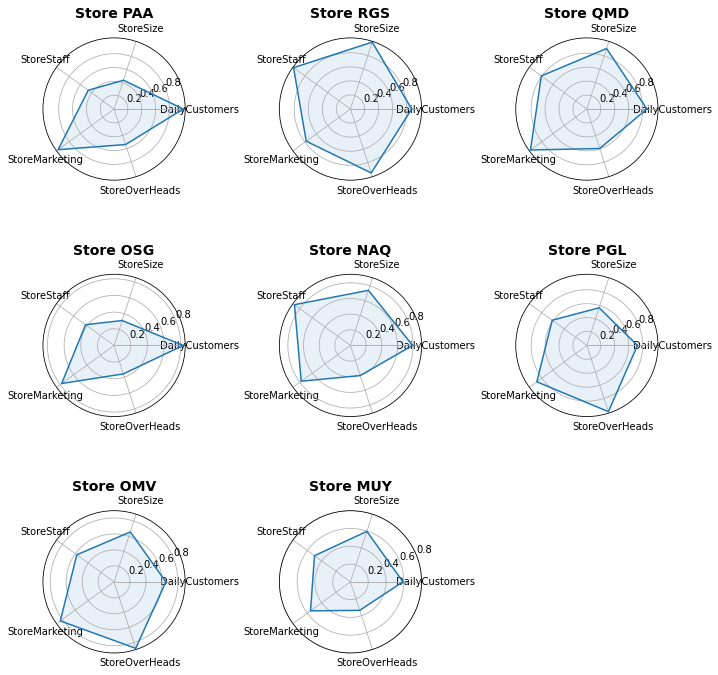

In [ ]:
#Calculating Normalised Data for Radar plots
NormalisedData = Medium_Stores_SummaryData / Medium_Stores_SummaryData.max()

angles = [n / float(len(Medium_Stores_SummaryData.columns)) * 2 * np.pi for n in range(len(Medium_Stores_SummaryData.columns) +1)]
plt.figure(figsize=(10,10))
counter = 1
for name in Medium_Stores_SummaryData.index:
    values = NormalisedData.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub = plt.subplot(3,3, counter, polar=True)
    sub.plot(angles, values)
    sub.fill(angles, values, alpha=0.1)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8])
    sub.set_xticks(angles)
    sub.set_xticklabels(Medium_Stores_SummaryData.columns, fontsize=10)
    sub.set_title('Store ' + name, fontsize=14, position = (0.5, 1.1), weight='bold')
    counter += 1
plt.subplots_adjust(wspace=0.2, hspace = 0.2)
plt.tight_layout()
plt.show()

The purpose of above Radar subplots is to compare all the summary data variables for Medium Stores

### Scatter plot for Store Size & Store Over head cost

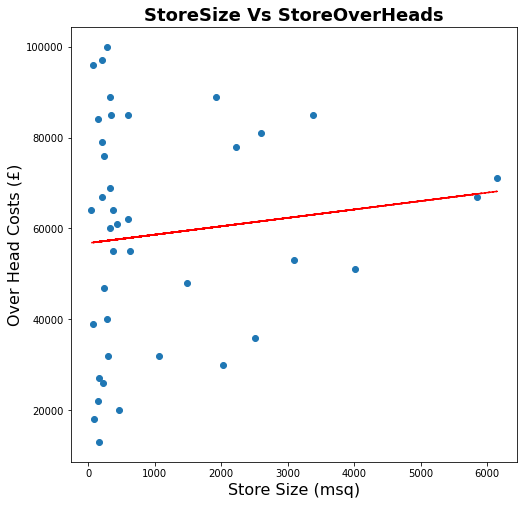

In [ ]:
x = StoreSummaryData['StoreSize']
y= StoreSummaryData['StoreOverHeads']
plt.figure(figsize=(8,8))
plt.scatter(x,y)
z = np.polyfit(x,y, 1)
p = np.poly1d(z)
plt.plot(x,p(x),"r--")

plt.title('StoreSize Vs StoreOverHeads', fontsize=18, weight='bold', position = (0.5, 1.05))
plt.xlabel('Store Size (msq)', fontsize=16)
plt.ylabel('Over Head Costs (£)', fontsize=16)

plt.show()

The purpose of the above scatter plot is to assess if stores are spending too much on overhead costs.

### Interactive Scatter Sub plots to compare sets of 2 variables

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
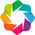

:Layout
   .Scatter.I   :Scatter   [DailyCustomers]   (StoreMarketing)
   .Scatter.II  :Scatter   [DailyCustomers]   (StoreSize)
   .Scatter.III :Scatter   [DailyCustomers]   (StoreOverHeads)

In [ ]:
ScatterStoreSummaryData = StoreSummaryData_Sort.copy()
ScatterStoreSummaryData['DailyCustomers'] = ScatterStoreSummaryData['DailyCustomers']* 0.1
ScatterStoreSummaryData['StoreOverHeads'] /= 10
plot = ScatterStoreSummaryData.hvplot.scatter(
    frame_height=300, frame_width=300,
    x='DailyCustomers', y='StoreMarketing', title='DailyCustomers vs StoreMarketing',
     tools=['pan', 'box_zoom', 'wheel_zoom', 'undo', 'redo', 'hover', 'save', 'reset']
) + \
ScatterStoreSummaryData.hvplot.scatter(
    frame_height=300, frame_width=300,
    x='DailyCustomers', y='StoreSize', title='DailyCustomers vs StoreSize',
     tools=['pan', 'box_zoom', 'wheel_zoom', 'undo', 'redo', 'hover', 'save', 'reset']
) + \
ScatterStoreSummaryData.hvplot.scatter(
    frame_height=300, frame_width=300,
    x='DailyCustomers', y='StoreOverHeads', title='DailyCustomers vs StoreOverHeads',
     tools=['pan', 'box_zoom', 'wheel_zoom', 'undo', 'redo', 'hover', 'save', 'reset']
)
hv.extension('bokeh')
plot

The above scatter sub plots are included to compare three sets of 2 variables in a single plot - Daily Customers with Store marketing, store size & over head costs.

Interactive tools availabe in hvplot are
*   Zoom  - helps to zoom in multiple times and clearly observe the issues. In sub plots, when zoom is applied to one sub plot, all the sub plots are zoomed in to same level.
*   Pan   - to move to a specific area in the plot without zooming.
*   Undo  - to undo any action and return to previous state of the plot.
*   Redo  - to do the same action that was undone.
*   Reset - Brings back the plot to default view.
*   Save  - allows to save a copy of the plot.
*   Hover - displays all information regarding a store when hovered over the line.

### Bubble plot - Daily Customers vs Store Size vs Staff Count

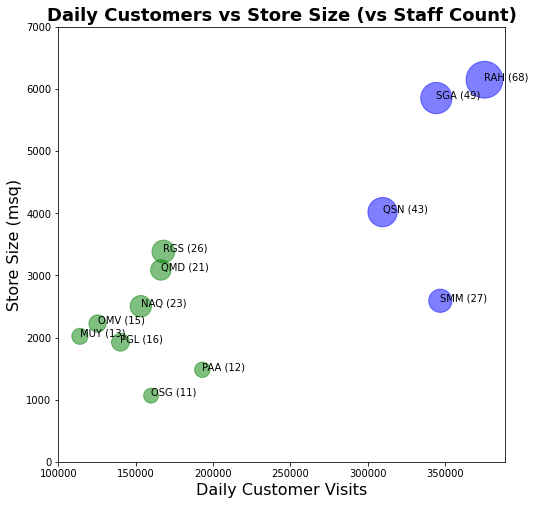

In [ ]:
#Converting the Store staff size to produce bigger bubble size
SummaryData_LargeStores = Large_Stores_SummaryData
SummaryData_MediumStores = Medium_Stores_SummaryData
SummaryData_LargeStores['BubbleSize'] = SummaryData_LargeStores['StoreStaff'] * 20
SummaryData_MediumStores['BubbleSize'] = SummaryData_MediumStores['StoreStaff'] * 20
SummaryData = SummaryData_LargeStores.append(SummaryData_MediumStores)

plt.figure(figsize=(8, 8))
plt.scatter(SummaryData_LargeStores['DailyCustomers'], SummaryData_LargeStores['StoreSize'], s=SummaryData_LargeStores['BubbleSize'], alpha=0.5, color='blue')
plt.scatter(SummaryData_MediumStores['DailyCustomers'], SummaryData_MediumStores['StoreSize'], s=SummaryData_MediumStores['BubbleSize'], alpha=0.5, color='green')
plt.title('Daily Customers vs Store Size (vs Staff Count)', fontsize=18, weight='bold', position=(0.5, 1.05))
plt.xlabel('Daily Customer Visits', fontsize=16)
plt.ylabel('Store Size (msq)', fontsize=16)
plt.xticks([100000, 150000, 200000, 250000, 300000, 350000])
plt.yticks([0, 1000, 2000, 3000, 4000, 5000, 6000, 7000])
for i, name in enumerate(SummaryData.index):
    plt.annotate(f"{name} ({SummaryData['StoreStaff'][i]})", (SummaryData['DailyCustomers'][i], SummaryData['StoreSize'][i]))
plt.show()

The purpose of the above bubble plot is to compare 3 variables - Daily Customer Visits & store size with store staff count. This helps to identify if the stores are understaffed or overstaffed and if there are more number of customers for a smaller store. Different colour bubbles are used for Large and Medium stores respectively.

### Interactive Bubble plot - Daily Customers vs Store Size vs Store Overhead costs

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
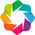

:Overlay
   .Scatter.I   :Scatter   [DailyCustomers]   (StoreSize,BubbleSize,index,StoreStaff,StoreMarketing,StoreOverHeads)
   .Scatter.II  :Scatter   [DailyCustomers]   (StoreSize,BubbleSize,index,StoreStaff,StoreMarketing,StoreOverHeads)
   .Scatter.III :Scatter   [DailyCustomers]   (StoreSize,BubbleSize,index,StoreStaff,StoreMarketing,StoreOverHeads)

In [ ]:
SummaryDataSmall = Small_Stores_SummaryData.copy()
SummaryDataSmall['BubbleSize'] = SummaryDataSmall['StoreOverHeads']
SummaryDataMedium = Medium_Stores_SummaryData
SummaryDataMedium['BubbleSize'] = SummaryDataMedium['StoreOverHeads']
SummaryDataLarge = Large_Stores_SummaryData
SummaryDataLarge['BubbleSize'] = SummaryDataLarge['StoreOverHeads']

plot = SummaryDataSmall.hvplot.scatter(
    frame_height=500, frame_width=500,
    title='Daily Customers vs Store Size (vs Over Head Cost)',
    xlabel='Daily Customers', ylabel='Store Size',
    alpha=0.5, padding=0.1, hover_cols='all', color='red',
    tools=['pan', 'box_zoom', 'wheel_zoom', 'undo', 'redo', 'hover', 'save', 'reset'],
    x='DailyCustomers', y='StoreSize', size='BubbleSize', scale = 0.2
) * SummaryDataMedium.hvplot.scatter(
    frame_height=500, frame_width=500,
    title='Daily Customers vs Store Size (vs Over Head Cost)',
    xlabel='Daily Customers', ylabel='Store Size',
    alpha=0.5, padding=0.1, hover_cols='all', color='blue',
    tools=['pan', 'box_zoom', 'wheel_zoom', 'undo', 'redo', 'hover', 'save', 'reset'],
    x='DailyCustomers', y='StoreSize', size='BubbleSize', scale = 0.2
) * SummaryDataLarge.hvplot.scatter(
    frame_height=500, frame_width=500,
    title='Daily Customers vs Store Size (vs Over Head Cost)',
    xlabel='Daily Customers', ylabel='Store Size',
    alpha=0.5, padding=0.1, hover_cols='all', color='green',
    tools=['pan', 'box_zoom', 'wheel_zoom', 'undo', 'redo', 'hover', 'save', 'reset'],
    x='DailyCustomers', y='StoreSize', size='BubbleSize', scale = 0.2
)
hv.extension('bokeh')
plot

The above interactive bubble plot is included to compare 3 variables Daily customer visits & store size vs Over head costs. Interactive plot is used so that small stores can be zoomed in multiple times and analysed

Interactive tools availabe are
*   Zoom  - helps to zoom in multiple times and clearly observe the issues.
*   Pan   - to move to a specific area in the plot without zooming.
*   Undo  - to undo any action and return to previous state of the plot.
*   Redo  - to do the same action that was undone.
*   Reset - Brings back the plot to default view.
*   Save  - allows to save a copy of the plot.
*   Hover - displays all information regarding a store when hovered over the line.